# Analyzing Socio-Economic Trends in Charlotte

## Introduction
In this data mining project, we aim to analyze the employment and income status of various block groups within Charlotte, NC, specifically focusing on Mecklenburg County. By examining datasets that include features such as household income, population over 16, geography, labor force participation, and unemployment rates, we seek to uncover patterns and trends that define the socio-economic landscape of Charlotte from 2011 to 2019. This analysis will provide valuable insights into how different communities within the city are grouped based on income, labor force participation, and access to amenities like trails.

### Impact of Project
The findings from this project can have significant implications for both policymakers and residents of Mecklenburg County. By identifying areas with high income and employment rates, as well as those that may need more support, it can be helpful to have direct resources and initiatives more effectively. This can lead to improved better-targeted social programs, and a more informed understanding of the city's growth and challenges. However, it is important to be mindful of the potential for stereotyping communities based on this data, the time where the data was taken, and to use the insights gained in a way that promotes inclusivity and equity. 

### What is Clustering and K-Means algorithm? 
Clustering is a data mining technique used to group similar data points together based on certain characteristics. It helps in identifying patterns and structures within the data that may not be immediately apparent. One of the most popular clustering algorithms is K-Means.

##### K-Means Clustering works as follows:

- Initialization: Choose the number of clusters (K) and randomly select K initial centroids.
- Assignment: Assign each data point to the nearest centroid, forming K clusters.
- Update: Calculate the new centroids by taking the mean of all data points in each cluster.
- Repeat: Repeat the assignment and update steps until the centroids no longer change significantly or a maximum number of iterations is reached.

In the context of our project, K-Means clustering can be used to group different block groups in Charlotte based on their socio-economic features. For example, we can identify clusters of blocks with similar income levels, employment rates, and access to amenities. This will help us understand how different areas of the city are evolving and what common characteristics they share.

### Analyzing the Data
For the sake of my project. I wanted to use two different datasets from Charlotte, NC used to display "Census Block Groups for the years 2015-2019 American Community Survey 5-Year Estimates in Mecklenburg County, North Carolina". This data was published on 2022 but it from the collected surveys from 2015-2019 which makes the data old for an well-around analysis and impact. I will be working with two differnet datasets to analyze the city based on two different aspects: Employment Status, and Household Income. 
#
<div>
<img src="CharlotteNCMap.png" width="500"/>
</div>


#### Employment Status Dataset: https://data.charlottenc.gov/datasets/charlotte::census-employment-status-block-groups-2/exp
The main idea of the dataset is to do an extract of selected geographic and cartographic information from the U.S. Census Bureau's Master Address File. This dataset analysis and holds information about the employment status in different blocks, zones, of Mecklenburg, NC. Looking at the dataset, there are a couple of attributes that are easy to identify what they hold, such as: "Not in labor force", or "Population 16 years and over". However, there are others that as not as obvious as "LOGRECNO", or "Shape_Area". Thus, I will be determining importance as I move forward analyzing and pre-processing the data. 

Features of this dataset: 
- STATEFP10
- COUNTYFP10
- TRACTCE10
- BLKGRPCE10
- GEOID10
- NAMELSAD10
- LOGRECNO
- geoname
- Population 16 years and over
- Populaiton in labor force
- Civilian labor force
- Civilian labor force employed
- Civilian_labor_force_unemployed
- Armed forces
- Not in labor force
- Unemployment Rate
- Shape__Area
- Shape__Length

#### Household Income Dataset: https://data.charlottenc.gov/datasets/charlotte::census-household-income-block-groups-2/about
Like wise, the main idea of the dataset is to, also, do an extract of selected geographic and cartographic information from the U.S. Census Bureau's Master Address File. Thus, the dataset holds information about the Household income of different blocks, zones, of Mecklenburg, NC. This dataset also identifiable attributes, such as: "Total Families", or "Family Poverty Rate". However, there are others that as not as obvious, at least for someone not as familiar with the topic, as "TRACTCE10".
Features of the dataset: 
- STATEFP10: code to specify states
- COUNTYFP10: code to specify county
- TRACTCE10: statistical subdivision of a county
- BLKGRPCE10: code for the block group
- GEOID10: concatenated geo identifier (combines state, country, tract, and block group) 
- NAMELSAD10: same as BLKGRPCE10 but string identifier
- LOGRECNO: logical record number for the dataset
- geoname: same as GEOID10 but as a string
- Total Households: total households in the area
- Household Income Less than 10000
- Household Income 10000-14999
- Household Income15000-19999
...
- Household Income 150000-199999
- Household Income 200000 or more
- Median Household Income
- Total Families: total families in the area
- Families In Poverty
- Family Poverty Rate
- Shape__Area
- Shape__Length


### Working with 'real' data
Working with real-world data from Charlotte, NC, is a new and exciting challenge for me. This is my first time diving into actual town data, and it's a bit different from the clean, perfect datasets we've used in class. Real-world data can be messy, with missing pieces and inconsistencies that need to be sorted out. I'm looking forward to exploring the socio-economic trends in Charlotte and seeing what patterns emerge. It's a great opportunity to learn more about the community and improve my data analysis skills in a practical way

## Pre-processing
I will be analyzing the datasets and see any stats to see what path to take

In [99]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from itertools import combinations

In [47]:
# read csv
data_employment = pd.read_csv('data/Census_Employment_Status_Block_Groups.csv')
data_income = pd.read_csv('data/Census_Household_Income_Block_Groups.csv')

In [48]:
# convert to dataframe
df_emp = pd.DataFrame(data_employment)
df_inc = pd.DataFrame(data_income)

In [49]:
df_emp.head()

,OBJECTID,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,LOGRECNO,geoname,Population_16_years_and_over,In_labor_force,Civilian_labor_force,Civilian_labor_force_employed,Civilian_labor_force_unemployed,Armed_forces,Not_in_labor_force,Unemployment_Rate,GlobalID,Shape__Area,Shape__Length
0,3331,37,119,1920,3,371190019203,Block Group 3,16225,"Block Group 3, Census Tract 19.20, Mecklenburg...",691,499,499,470,29,0,192,0.058116,ad803924-2839-4716-af48-7f5b22ed00f1,5.033422e+06,10882.286117
1,3332,37,119,5846,2,371190058462,Block Group 2,16578,"Block Group 2, Census Tract 58.46, Mecklenburg...",1781,1104,1104,1034,70,0,677,0.063406,429648b4-3928-465e-862f-9d6d74710b17,2.742804e+07,25848.887577
2,3333,37,119,5510,1,371190055101,Block Group 1,16423,"Block Group 1, Census Tract 55.10, Mecklenburg...",1368,988,988,937,51,0,380,0.051619,f5b337c0-03bc-4e9b-ba25-23e28ed28f3e,4.013663e+07,27127.427970
3,3334,37,119,6404,1,371190064041,Block Group 1,16674,"Block Group 1, Census Tract 64.04, Mecklenburg...",1412,846,846,839,7,0,566,0.008274,944da35c-5241-4c86-a035-83de739cbdfb,1.214716e+08,51184.172136
4,3335,37,119,6405,1,371190064051,Block Group 1,16676,"Block Group 1, Census Tract 64.05, Mecklenburg...",2385,1649,1649,1632,17,0,736,0.010309,26cd14b2-6cce-4e6c-8fcc-130bc5768d3b,2.954331e+07,25281.772955


In [50]:
df_inc.head()

,OBJECTID,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,LOGRECNO,geoname,Total_Households,...,i125000_to_149999,i150000_to_199999,i200000_or_more,Median_Household_Income,TotalFamilies,FamiliesInPoverty,FamilyPovertyRate,GlobalID,Shape__Area,Shape__Length
0,3331,37,119,1609,2,371190016092,Block Group 2,16185,"Block Group 2, Census Tract 16.09, Mecklenburg...",995,...,32,10,0,45963,558,149,0.267025,0604ad89-6954-4390-8e68-9f8f6992e321,1.447086e+07,18153.991511
1,3332,37,119,3109,1,371190031091,Block Group 1,16319,"Block Group 1, Census Tract 31.09, Mecklenburg...",1101,...,0,37,0,43609,513,107,0.208577,9378d28f-3531-4e16-b807-5e081a04ef38,5.838492e+06,11934.206452
2,3333,37,119,6405,2,371190064052,Block Group 2,16677,"Block Group 2, Census Tract 64.05, Mecklenburg...",1101,...,30,147,147,85258,622,14,0.022508,330fa39f-581e-4c55-8a34-164cfbe9e428,9.416605e+07,46805.884093
3,3334,37,119,2702,1,371190027021,Block Group 1,16260,"Block Group 1, Census Tract 27.02, Mecklenburg...",842,...,103,70,368,180175,550,14,0.025455,862bc825-2b8d-4a61-941f-0e6031cad9a7,1.737750e+07,18116.211387
4,3335,37,119,3013,1,371190030131,Block Group 1,16296,"Block Group 1, Census Tract 30.13, Mecklenburg...",1065,...,81,152,522,194514,849,14,0.016490,27ee8e5c-14df-419b-be4e-c53327dd2454,3.709292e+07,36604.354128


In [51]:
# shape of dataframes
print(f'Employment dataset shape: {df_emp.shape}, Household Income dataset shape: {df_inc.shape}')

Employment dataset shape: (555, 20), Household Income dataset shape: (555, 33)


In [52]:
# data types of dataframes
print(f'df_emp:{df_emp.dtypes} df_inc:{df_inc.dtypes}')

df_emp:OBJECTID                             int64
STATEFP10                            int64
COUNTYFP10                           int64
TRACTCE10                            int64
BLKGRPCE10                           int64
GEOID10                              int64
NAMELSAD10                          object
LOGRECNO                             int64
geoname                             object
Population_16_years_and_over         int64
In_labor_force                       int64
Civilian_labor_force                 int64
Civilian_labor_force_employed        int64
Civilian_labor_force_unemployed      int64
Armed_forces                         int64
Not_in_labor_force                   int64
Unemployment_Rate                  float64
GlobalID                            object
Shape__Area                        float64
Shape__Length                      float64
dtype: object df_inc:OBJECTID                     int64
STATEFP10                    int64
COUNTYFP10                   int64
TRACTCE

Most of the dataset are numbers already so it will be easier to manupulate. It seems like the datasets cover the same blocks or zones on Charlotte. However, when trying to merge them, they only had 5 rows in common. Thus, we will be working on them separately. 

In [53]:
# get unique values of the dataframes
for k, v in df_emp.items():
    print(f'unique items: {df_emp[k].nunique()}  feature: {k}')
    
print('__________')

for k, v in df_inc.items():
    print(f'unique items: {df_inc[k].nunique()}  feature: {k}')

unique items: 555  feature: OBJECTID
unique items: 1  feature: STATEFP10
unique items: 1  feature: COUNTYFP10
unique items: 233  feature: TRACTCE10
unique items: 6  feature: BLKGRPCE10
unique items: 555  feature: GEOID10
unique items: 6  feature: NAMELSAD10
unique items: 555  feature: LOGRECNO
unique items: 555  feature: geoname
unique items: 490  feature: Population_16_years_and_over
unique items: 475  feature: In_labor_force
unique items: 473  feature: Civilian_labor_force
unique items: 471  feature: Civilian_labor_force_employed
unique items: 148  feature: Civilian_labor_force_unemployed
unique items: 21  feature: Armed_forces
unique items: 407  feature: Not_in_labor_force
unique items: 475  feature: Unemployment_Rate
unique items: 555  feature: GlobalID
unique items: 555  feature: Shape__Area
unique items: 555  feature: Shape__Length
__________
unique items: 555  feature: OBJECTID
unique items: 1  feature: STATEFP10
unique items: 1  feature: COUNTYFP10
unique items: 233  feature: T

After analysis the data, I believe I will be dropping the following features: OBJECTID, STATEFP10, COUNTRYFP10, GEOID10, NAMELSAD10, LOGRECNO, geoname, GlobalID. I will be dropping these values since they are just unique identifiers of the area. Although they are important when it comes to the bigger picture and analysis. However, I would not need those identifiers since we are working with the same city. Thus, the information is irrelevant because it is all the same.  

In [54]:
# drop irrelevant columns
df_emp = df_emp.drop(['OBJECTID','STATEFP10', 'COUNTYFP10', 'GEOID10', 'NAMELSAD10', 'LOGRECNO', 'geoname', 'GlobalID'], axis=1)
df_emp

,TRACTCE10,BLKGRPCE10,Population_16_years_and_over,In_labor_force,Civilian_labor_force,Civilian_labor_force_employed,Civilian_labor_force_unemployed,Armed_forces,Not_in_labor_force,Unemployment_Rate,Shape__Area,Shape__Length
0,1920,3,691,499,499,470,29,0,192,0.058116,5.033422e+06,10882.286117
1,5846,2,1781,1104,1104,1034,70,0,677,0.063406,2.742804e+07,25848.887577
2,5510,1,1368,988,988,937,51,0,380,0.051619,4.013663e+07,27127.427970
3,6404,1,1412,846,846,839,7,0,566,0.008274,1.214716e+08,51184.172136
4,6405,1,2385,1649,1649,1632,17,0,736,0.010309,2.954331e+07,25281.772955
...,...,...,...,...,...,...,...,...,...,...,...,...
550,1702,1,958,699,699,661,38,0,259,0.054363,1.897104e+07,19063.699775
551,5621,1,1898,1387,1372,1352,20,15,511,0.014420,4.949538e+07,31190.061156
552,3008,3,1656,951,951,951,0,0,705,0.000000,2.418330e+07,21947.985177
553,5511,3,1244,949,949,941,8,0,295,0.008430,5.156997e+06,10629.623345


In [55]:
# drop irrelevant columns
df_inc = df_inc.drop(['OBJECTID','STATEFP10', 'COUNTYFP10', 'GEOID10', 'NAMELSAD10', 'LOGRECNO', 'geoname', 'GlobalID'], axis=1)
df_inc

,TRACTCE10,BLKGRPCE10,Total_Households,Less_than_10000,i10000_to_14999,i15000_to19999,i20000_to_24999,i25000_to_29999,i30000_to_34999,i35000_to_39999,...,i100000_to_124999,i125000_to_149999,i150000_to_199999,i200000_or_more,Median_Household_Income,TotalFamilies,FamiliesInPoverty,FamilyPovertyRate,Shape__Area,Shape__Length
0,1609,2,995,111,37,46,73,66,38,87,...,68,32,10,0,45963,558,149,0.267025,1.447086e+07,18153.991511
1,3109,1,1101,40,11,44,136,102,125,25,...,49,0,37,0,43609,513,107,0.208577,5.838492e+06,11934.206452
2,6405,2,1101,20,46,49,40,28,57,25,...,141,30,147,147,85258,622,14,0.022508,9.416605e+07,46805.884093
3,2702,1,842,18,14,0,25,12,58,0,...,30,103,70,368,180175,550,14,0.025455,1.737750e+07,18116.211387
4,3013,1,1065,37,14,0,0,0,16,0,...,62,81,152,522,194514,849,14,0.016490,3.709292e+07,36604.354128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
550,1801,2,168,13,9,18,16,0,6,6,...,6,19,0,21,59750,86,0,0.000000,7.258220e+06,16132.903715
551,5403,2,600,25,74,24,19,8,46,22,...,61,0,15,0,50368,324,49,0.151235,2.454919e+07,23960.730077
552,5817,2,1135,41,9,9,7,0,15,23,...,90,100,190,295,129028,936,35,0.037393,2.943564e+07,23981.466563
553,5306,1,243,48,6,5,7,4,43,28,...,16,0,0,0,35850,112,6,0.053571,7.114165e+06,16261.887420


### Normalizing datasets for the modeling process
The dataset is pretty clean so I will be just normalizing some features and adapting some others to then start with visualizations and plugging the datasets into graphs

In [56]:
# inititalize the MinMaxScaler
scaler = MinMaxScaler()

In [57]:
# fit and transform employment data
data_empN = scaler.fit_transform(df_emp)
df_empN = pd.DataFrame(data_empN)
df_empN

,0,1,2,3,4,5,6,7,8,9,10,11
0,0.001857,0.4,0.149859,0.136862,0.136862,0.133333,0.081690,0.000000,0.079668,0.151102,0.008386,0.048437
1,0.005862,0.2,0.386250,0.302798,0.302798,0.293333,0.197183,0.000000,0.280913,0.164855,0.068923,0.184690
2,0.005519,0.0,0.296682,0.270982,0.270982,0.265816,0.143662,0.000000,0.157676,0.134211,0.103276,0.196329
3,0.006431,0.0,0.306224,0.232035,0.232035,0.238014,0.019718,0.000000,0.234855,0.021513,0.323141,0.415336
4,0.006432,0.0,0.517241,0.452276,0.452276,0.462979,0.047887,0.000000,0.305394,0.026804,0.074641,0.179527
...,...,...,...,...,...,...,...,...,...,...,...,...
550,0.001634,0.0,0.207764,0.191717,0.191717,0.187518,0.107042,0.000000,0.107469,0.141345,0.046062,0.122919
551,0.005633,0.0,0.411624,0.380417,0.376303,0.383546,0.056338,0.245902,0.212033,0.037491,0.128575,0.233315
552,0.002967,0.4,0.359141,0.260834,0.260834,0.269787,0.000000,0.000000,0.292531,0.000000,0.060152,0.149177
553,0.005520,0.4,0.269790,0.260285,0.260285,0.266950,0.022535,0.000000,0.122407,0.021918,0.008720,0.046137


In [58]:
# fit and transform household income data
data_incN = scaler.fit_transform(df_inc)
df_incN = pd.DataFrame(data_incN)
df_incN

,0,1,2,3,4,5,6,7,8,9,...,15,16,17,18,19,20,21,22,23,24
0,0.001539,0.2,0.473584,0.242358,0.201087,0.230,0.410112,0.308411,0.156379,0.432836,...,0.163855,0.125984,0.021834,0.000000,0.183852,0.346584,0.356459,0.332582,0.033897,0.114637
1,0.003070,0.0,0.524036,0.087336,0.059783,0.220,0.764045,0.476636,0.514403,0.124378,...,0.118072,0.000000,0.080786,0.000000,0.174436,0.318634,0.255981,0.259785,0.010562,0.058014
2,0.006432,0.2,0.524036,0.043668,0.250000,0.245,0.224719,0.130841,0.234568,0.124378,...,0.339759,0.118110,0.320961,0.221386,0.341032,0.386335,0.033493,0.028034,0.249329,0.375477
3,0.002655,0.0,0.400762,0.039301,0.076087,0.000,0.140449,0.056075,0.238683,0.000000,...,0.072289,0.405512,0.152838,0.554217,0.720700,0.341615,0.033493,0.031704,0.041754,0.114293
4,0.002972,0.0,0.506901,0.080786,0.076087,0.000,0.000000,0.000000,0.065844,0.000000,...,0.149398,0.318898,0.331878,0.786145,0.778056,0.527329,0.033493,0.020538,0.095049,0.282605
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
550,0.001735,0.2,0.079962,0.028384,0.048913,0.090,0.089888,0.000000,0.024691,0.029851,...,0.014458,0.074803,0.000000,0.031627,0.239000,0.053416,0.000000,0.000000,0.014400,0.096238
551,0.005410,0.2,0.285578,0.054585,0.402174,0.120,0.106742,0.037383,0.189300,0.109453,...,0.146988,0.000000,0.032751,0.000000,0.201472,0.201242,0.117225,0.188364,0.061141,0.167500
552,0.005832,0.2,0.540219,0.089520,0.048913,0.045,0.039326,0.000000,0.061728,0.114428,...,0.216867,0.393701,0.414847,0.444277,0.516112,0.581366,0.083732,0.046574,0.074350,0.167689
553,0.005311,0.0,0.115659,0.104803,0.032609,0.025,0.039326,0.018692,0.176955,0.139303,...,0.038554,0.000000,0.000000,0.000000,0.143400,0.069565,0.014354,0.066724,0.014010,0.097412


## Data Visualization

I will be using PCA to visualize the data and understand where the clusters are being formed. I want to also test how efficient PCA is with normalized data. I will be also just building visualizations to see if I can detect any patterns.

In [59]:
from sklearn.decomposition import PCA

### Employment Dataset

C:\Users\dagon\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


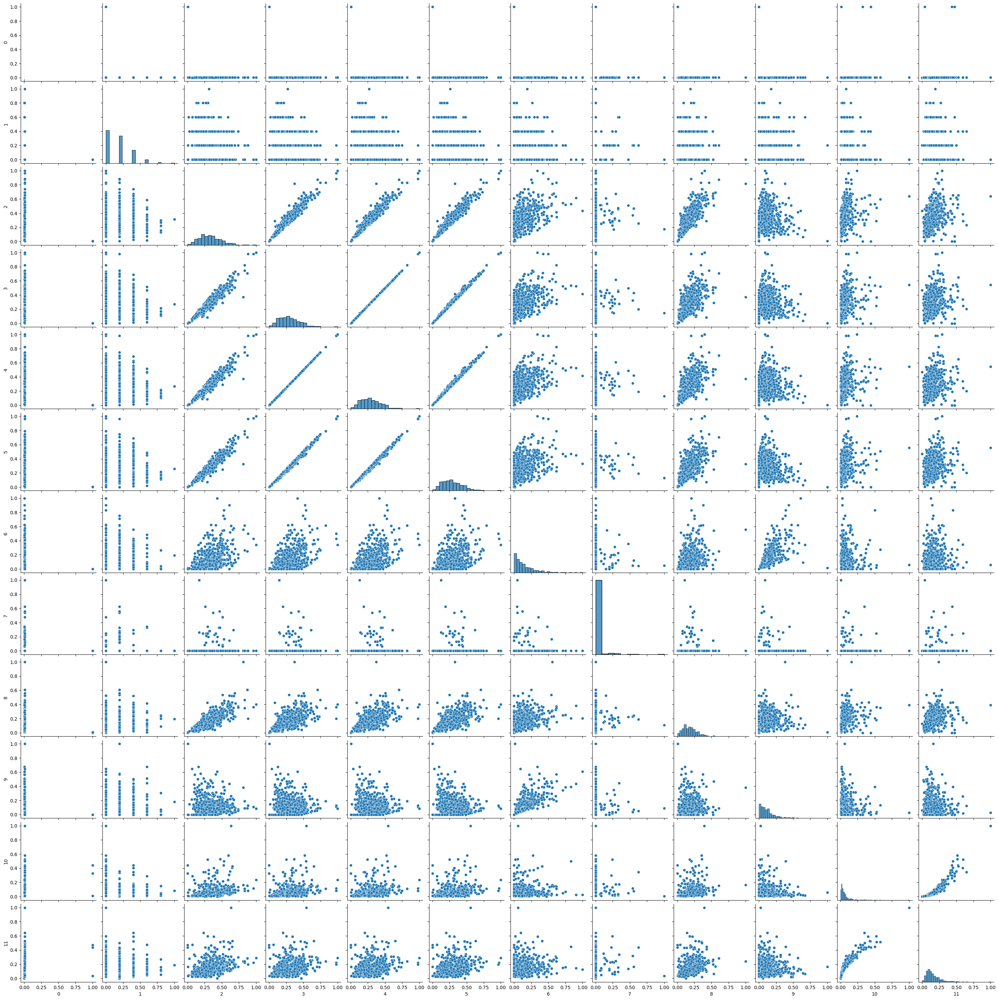

In [57]:
sns.pairplot(df_empN)

It seems like there are some relationships in this dataset that can be great for clustering and finding patterns with the data for everything that is not a straight line

<Axes: title={'center': 'Employment in Different Blocks'}>

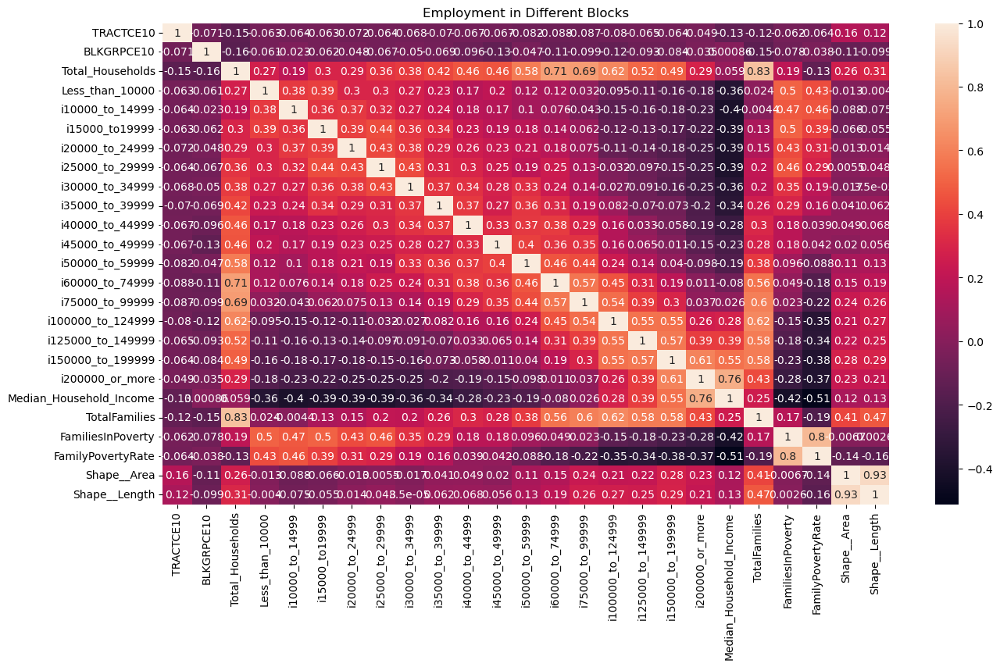

In [65]:
plt.figure(figsize=(15,8))
plt.title('Employment in Different Blocks')
sns.heatmap(df_inc.corr(numeric_only=True), annot=True)

there are plenty of features that have some type of correlation with each other. Some of them are correlations what we care about and others not quite as much (such as shape_area and shape_length) 

### PCA for Employment

In [111]:
pca = PCA(n_components=3)
pca_mdl = pca.fit_transform(df_empN)
pca_df = pd.DataFrame(pca_mdl, columns=['pca1', 'pca2', 'pca3'])

In [112]:
pca_df

,pca1,pca2,pca3
0,-0.393082,0.170986,0.044172
1,0.067810,0.034012,0.055509
2,-0.022650,-0.184531,0.007167
3,-0.031725,-0.200484,-0.172885
4,0.338878,-0.120808,-0.200699
...,...,...,...
550,-0.207076,-0.207946,0.023142
551,0.181165,-0.150613,-0.166799
552,-0.076219,0.220676,-0.178359
553,-0.170404,0.209266,-0.131379


#### PCA Grouping

<Axes: xlabel='pca2', ylabel='pca3'>

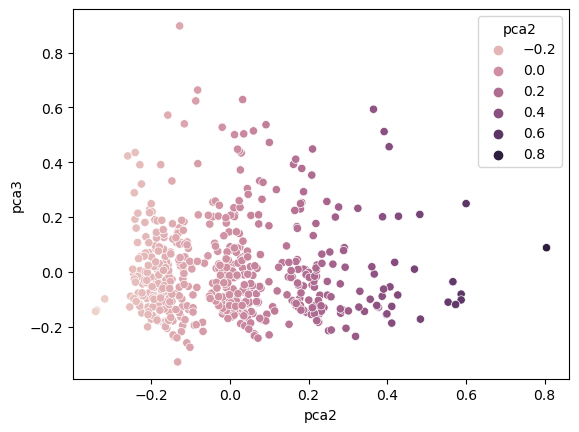

In [121]:
sns.scatterplot(x=pca_df['pca2'], y=pca_df['pca3'], hue=pca_df['pca2'])

### Household Income Dataset

There are also a lot of visuals in this dataset that cna give us an idea in the grouping of it

C:\Users\dagon\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


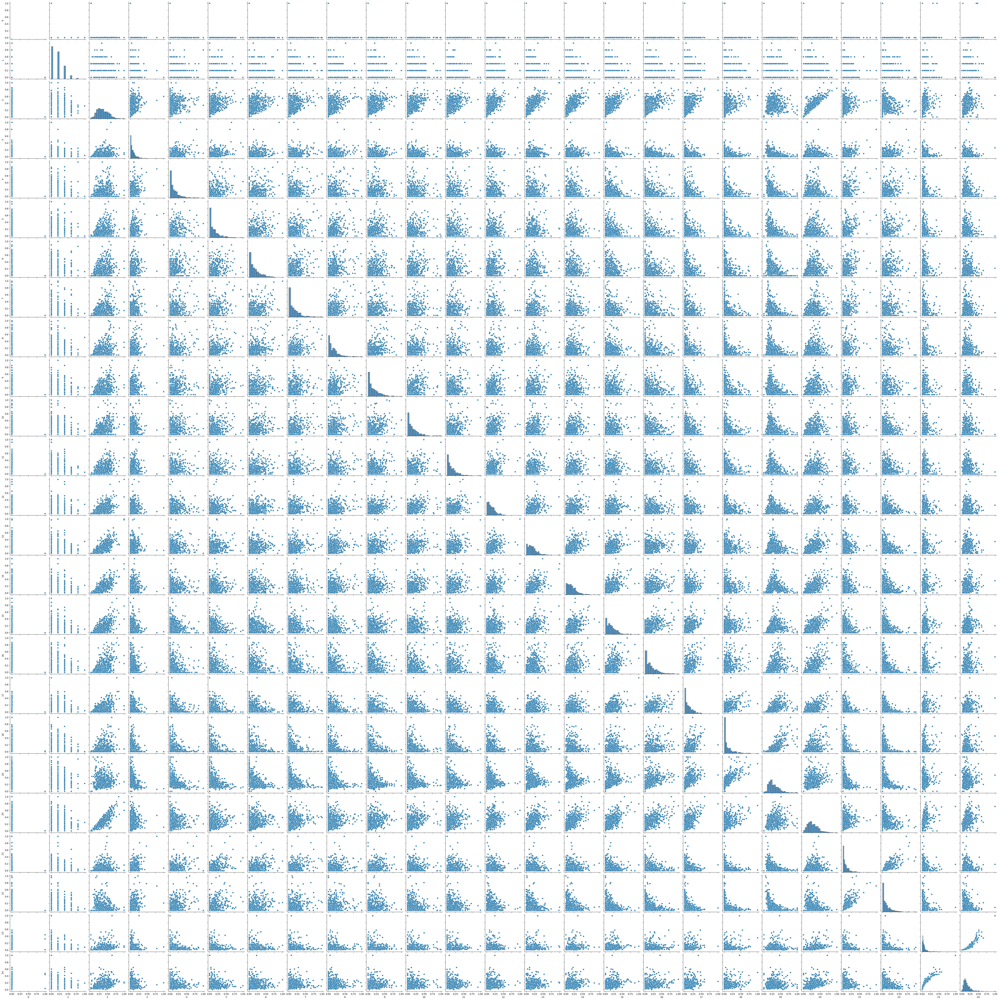

In [58]:
sns.pairplot(df_incN)

<Axes: title={'center': 'Household Income in Different Blocks'}>

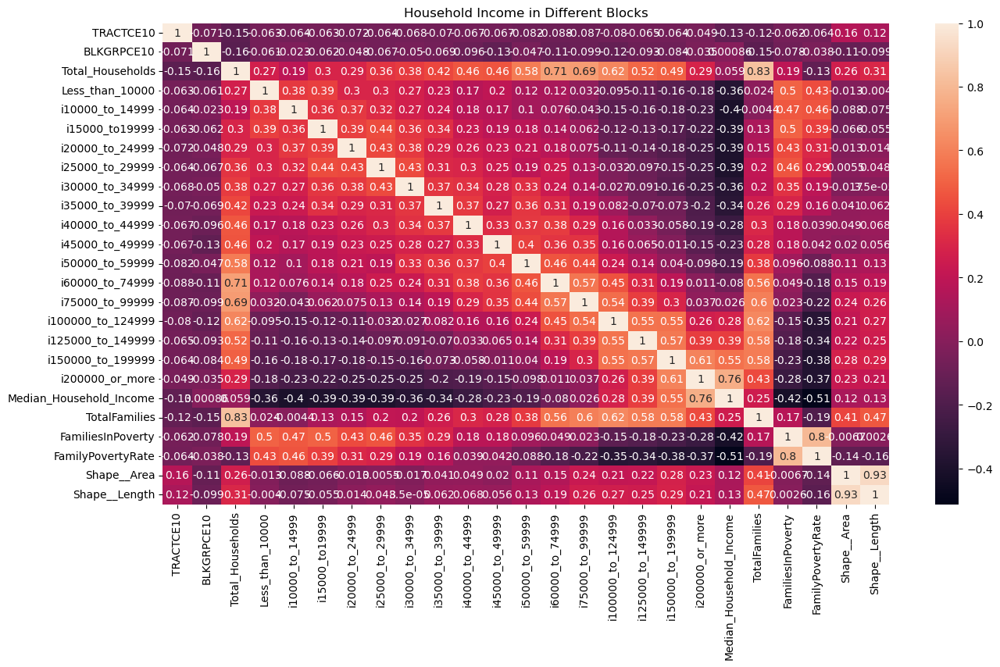

In [64]:
plt.figure(figsize=(15,8))
plt.title('Household Income in Different Blocks')
sns.heatmap(df_inc.corr(numeric_only=True), annot=True)

after these visuals, we can have an idea of where the data leads and the correlations among features

## Modeling : Clustering

In [96]:
from sklearn.cluster import KMeans

### Employment Dataset

In [123]:
inertia = []
for k in range(1,8):
    kmeans = KMeans(n_clusters=k, random_state=1).fit(df_empN)
    inertia.append(np.sqrt(kmeans.inertia_))

C:\Users\dagon\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\dagon\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\dagon\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\dagon\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are

Text(0, 0.5, 'Variance')

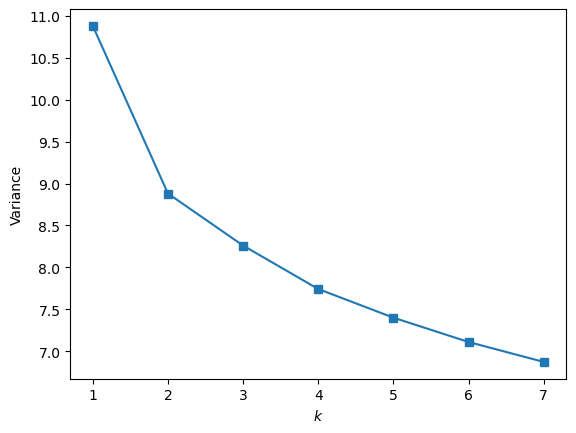

In [124]:
plt.plot(range(1, 8), inertia, marker='s');
plt.xlabel('$k$')
plt.ylabel('Variance')

After the graph, I will be picking 3 as the k value for the cluster

In [126]:
kmeans = KMeans(n_clusters=3, random_state=42).fit(df_empN)

C:\Users\dagon\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\dagon\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


In [140]:
df_emp['Cluster'] = kmeans.labels_

0      2
1      0
2      0
3      0
4      1
      ..
550    2
551    0
552    0
553    2
554    2
Name: Cluster, Length: 555, dtype: int32

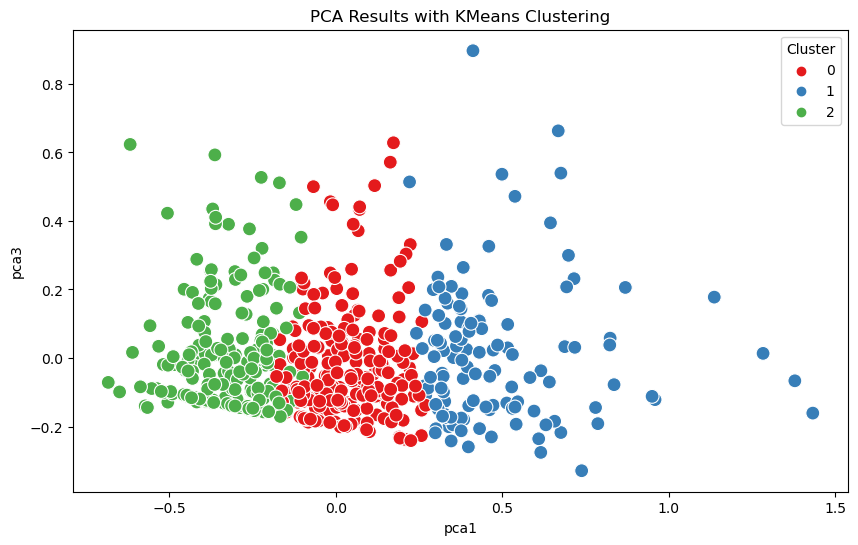

In [139]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='pca1', y='pca3', hue='Cluster', palette='Set1', s=100)
plt.title('PCA Results with KMeans Clustering')
plt.show()

Here, we can see how the clusters are formed with the pca dataframe and the clustering model separating the groups. Therefore, there is a relationship in groups for the dataset

C:\Users\dagon\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


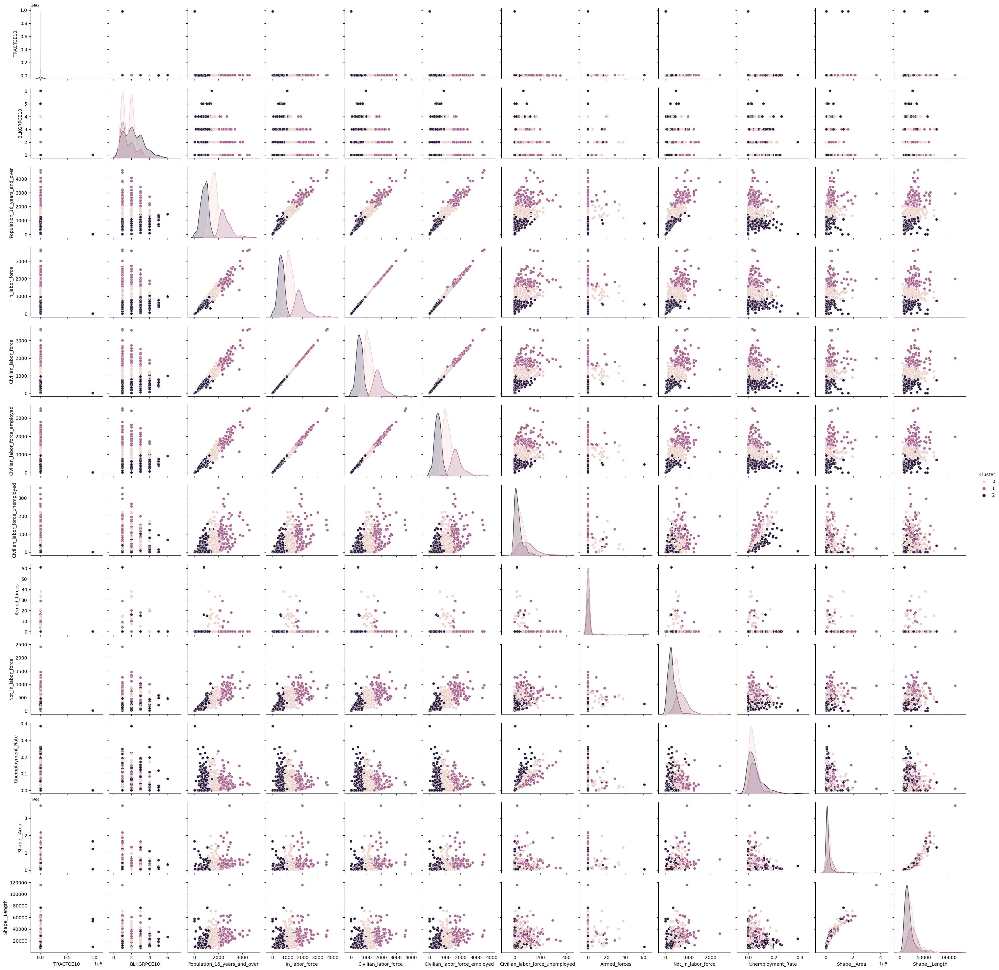

In [142]:
sns.pairplot(df_emp, hue='Cluster')

The scatter plot looks very similar to some of the pairplots above. Thus, we can have an idea of the features that were considered for the clustering model such as: 'Population_16_years_and_over' vs 'Unemployment_Rate'; 'Civilian_labor_force_emploted' vs 'Not_in_labor_force'; etc. 

### Household Income Dataset

In [131]:
inertia = []
for k in range(1,8):
    kmeans = KMeans(n_clusters=k, random_state=1).fit(df_incN)
    inertia.append(np.sqrt(kmeans.inertia_))

C:\Users\dagon\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\dagon\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\dagon\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\dagon\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are

Text(0, 0.5, 'Variance')

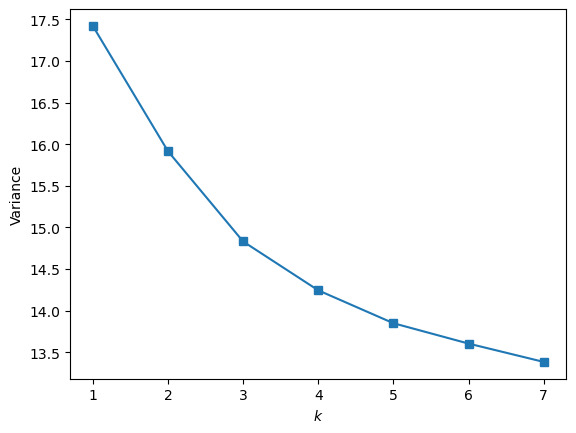

In [132]:
plt.plot(range(1, 8), inertia, marker='s');
plt.xlabel('$k$')
plt.ylabel('Variance')

I picked a k of 3 also for the clusterings as well sicne it seems to be doing the best

In [167]:
kmeans = KMeans(n_clusters=3, random_state=43).fit(df_incN)

C:\Users\dagon\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\dagon\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


I also started the pca for this dataset with 3 components for when it comes to visualizing the dataset

In [165]:
# pca for household income
pca = PCA(n_components=3)
pca_mdl = pca.fit_transform(df_incN)
pca_df = pd.DataFrame(pca_mdl, columns=['pca1', 'pca2', 'pca3'])

In [169]:
df_inc['Cluster'] = kmeans.labels_

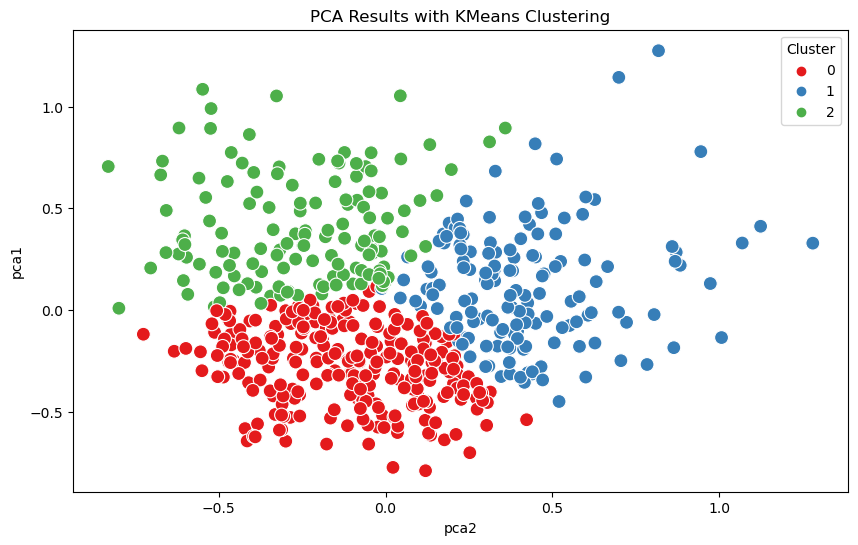

In [170]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=pca_df, x='pca2', y='pca1', hue='Cluster', palette='Set1', s=100)
plt.title('PCA Results with KMeans Clustering')
plt.show()

Here, we can also see that the data tend to split into 3 clusters and it is somewhat splitted evenly

In [172]:
cluster_analysis = df_inc.groupby('Cluster').count()
cluster_analysis.T

Cluster,0,1,2
TRACTCE10,263,152,140
BLKGRPCE10,263,152,140
Total_Households,263,152,140
Less_than_10000,263,152,140
i10000_to_14999,263,152,140
i15000_to19999,263,152,140
i20000_to_24999,263,152,140
i25000_to_29999,263,152,140
i30000_to_34999,263,152,140
i35000_to_39999,263,152,140


## Conlusion
There can be see that there are different clusters in the two datasets with the Employment dataset in Charlotte and the Household income dataset in Charlotte as well. These clusters can be useful to understanding the data more in depth. I chose hte k-means algorithm because, after visualizing the datasets, it seemed to be a good fit for those. 

There are many features that are relevant to determining what datapoint belongs into what cluster. As visualized in the different graphs, we can have the idea for the following: 

- In the Employment dataset: the features that tend to be relevant to determining the cluster the data point belongs to are: 
    - unemployment rate
    - Population 16 years and over
    - Civilian labor force
    - Armed forces
    

- In the Household Income dataset: the features that tend to be relevant to determining the cluster the data point belongs to are: 
    - Families In Poverty
    - Total Households
    - Median Household Income
    - Family Poverty Rate
    
With these features, we were able to see the comparison and grouping of different areas or zones in Charlotte and make relations of one another. It was very interesting workign with this dataset and seeing the possibilities come into play. Thus, I believe that the insigths were very interesting, as well as the flow of the dataframes

#### References
- https://seaborn.pydata.org/generated/seaborn.pairplot.html
- https://towardsdatascience.com/k-means-clustering-with-scikit-learn-6b47a369a83c
- https://scikit-learn.org/dev/modules/generated/sklearn.decomposition.PCA.html
- https://scikit-learn.org/1.5/modules/clustering.html